# Reproducibility Study of “Studying How to Efficiently and Effectively Guide Models with Explanations”

Description: This file is part of a project aiming to reproduce the study titled "Studying How to Efficiently and 
Effectively Guide Models with Explanations." The project focuses on verifying the results and methodologies 
proposed in the original study, and potentially extending or refining the study's findings.

Based on the code of orginal paper: https://github.com/sukrutrao/Model-Guidance

### 1. Load the data

#### Download the ImageNet Model Weight

In [1]:
import os
import subprocess

bcos_path = os.path.join(os.getcwd(), "weights/bcos/resnet_50-f46c1a4159.pth")

# Check if the xdnn directory exists and if the xfixup_resnet50_model_best.pth.tar exists
if not os.path.exists(bcos_path):

    # Check if the xdnn directory exists, create if it doesn't
    if not os.path.exists(os.path.join(os.getcwd(), "weights/xdnn")):
        os.makedirs(os.path.join(os.getcwd(), "weights/xdnn"))
        
    # Download the xfixup_resnet50_model_best.pth.tar
    subprocess.run(["wget", "-P", os.path.join(os.getcwd(), "weights/xdnn"), "https://download.visinf.tu-darmstadt.de/data/2021-neurips-fast-axiomatic-attribution/models/xfixup_resnet50_model_best.pth.tar"])

xdnn_path = os.path.join(os.getcwd(), "weights/xdnn/xfixup_resnet50_model_best.pth.tar")

# Check if the bcos directory exists and if the resnet_50-f46c1a4159.pth exists
if not os.path.exists("weights/bcos/resnet_50-f46c1a4159.pth"):

    # Check if the bcos directory exists, create if it doesn't
    if not os.path.exists(os.path.join(os.getcwd(), "weights/bcos")):
        os.makedirs(os.path.join(os.getcwd(), "weights/bcos"))

    # Download the resnet_50-f46c1a4159.pth
    subprocess.run(["wget", "-O", os.path.join(os.getcwd(), "weights/bcos/resnet_50-f46c1a4159.pth"), "https://nextcloud.mpi-klsb.mpg.de/index.php/s/3Yk6p86SBBFYSBN/download"])

--2024-02-02 13:59:46--  https://download.visinf.tu-darmstadt.de/data/2021-neurips-fast-axiomatic-attribution/models/xfixup_resnet50_model_best.pth.tar
Resolving download.visinf.tu-darmstadt.de (download.visinf.tu-darmstadt.de)... 130.83.164.225
Connecting to download.visinf.tu-darmstadt.de (download.visinf.tu-darmstadt.de)|130.83.164.225|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 204065028 (195M) [application/octet-stream]
Saving to: ‘/media/arco/DATA/A Ubuntu/Old School Stuff/FACTifAI_2024_3/weights/xdnn/xfixup_resnet50_model_best.pth.tar’

     0K .......... .......... .......... .......... ..........  0%  994K 3m20s
    50K .......... .......... .......... .......... ..........  0% 1,25M 2m58s
   100K .......... .......... .......... .......... ..........  0% 1,82M 2m34s
   150K .......... .......... .......... .......... ..........  0% 2,25M 2m17s
   200K .......... .......... .......... .......... ..........  0% 2,40M 2m6s
   250K .......... .......

. .......... .......... ..........  1% 3,21M 51s
  3950K .......... .......... .......... .......... ..........  2% 1,77M 52s
  4000K .......... .......... .......... .......... ..........  2% 2,56M 52s
  4050K .......... .......... .......... .......... ..........  2% 3,30M 52s
  4100K .......... .......... .......... .......... ..........  2% 2,60M 52s
  4150K .......... .......... .......... .......... ..........  2% 3,02M 52s
  4200K .......... .......... .......... .......... ..........  2% 2,36M 53s
  4250K .......... .......... .......... .......... ..........  2% 2,03M 53s
  4300K .......... .......... .......... .......... ..........  2% 4,24M 53s
  4350K .......... .......... .......... .......... ..........  2% 2,45M 53s
  4400K .......... .......... .......... .......... ..........  2% 3,41M 53s
  4450K .......... .......... .......... .......... ..........  2% 2,71M 53s
  4500K .......... .......... .......... .......... ..........  2% 1,26M 54s
  4550K .......... ........

#### For VOC2007

First, we load the data of VOC2007. The data is stored in the folder `datasets/VOC2007/`. The data is stored in the format of `.pt` file. We use the function `preprocess_voc2007.py` to load the data. Because this is run in a Jupyter Notebook, the `argspace` library is used to pass the arguments.

In [2]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "train"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

100%|██████████| 460032000/460032000 [01:27<00:00, 5241848.74it/s]


Extracting datasets/VOC2007/VOCtrainval_06-Nov-2007.tar to datasets/VOC2007/


100%|██████████| 2501/2501 [00:05<00:00, 424.47it/s]


In [3]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "val"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

Using downloaded and verified file: datasets/VOC2007/VOCtrainval_06-Nov-2007.tar
Extracting datasets/VOC2007/VOCtrainval_06-Nov-2007.tar to datasets/VOC2007/


100%|██████████| 2510/2510 [00:05<00:00, 426.01it/s]


In [4]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "test"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

100%|██████████| 451020800/451020800 [00:39<00:00, 11286565.18it/s]


Extracting datasets/VOC2007/VOCtest_06-Nov-2007.tar to datasets/VOC2007/


100%|██████████| 4952/4952 [00:11<00:00, 420.79it/s]


In [5]:
import os
import argparse

from datasets.VOC2007.preprocess import preprocess_voc2007

data_root = "datasets/VOC2007/"
split = "trainval"
save_path = "datasets/VOC2007/processed/"

args = {
    "data_root": data_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for VOC2007 dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_voc2007(args)

Using downloaded and verified file: datasets/VOC2007/VOCtrainval_06-Nov-2007.tar
Extracting datasets/VOC2007/VOCtrainval_06-Nov-2007.tar to datasets/VOC2007/


100%|██████████| 5011/5011 [00:11<00:00, 420.13it/s]


### For waterbirds

Secondly, we load the data of waterbirds. The data is stored in the folder `datasets/WATERBIRDS/`. The data is stored in the format of `.pt` file. We use the function `preprocess_waterbirds.py` to load the data. Because this is run in a Jupyter Notebook, the `argspace` library is used to pass the arguments.

In [6]:
import argparse 
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "train"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

Downloading...
From (original): https://drive.google.com/uc?id=1zJpQYGEt1SuwitlNfE06TFyLaWX-st1k
From (redirected): https://drive.google.com/uc?id=1zJpQYGEt1SuwitlNfE06TFyLaWX-st1k&confirm=t&uuid=429ec193-7a53-43d3-b87f-e45e02cad167
To: /media/arco/DATA/A Ubuntu/Old School Stuff/FACTifAI_2024_3/waterbird_1.0_forest2water2.tar.gz
100%|██████████| 376M/376M [00:35<00:00, 10.7MB/s] 
100%|██████████| 4795/4795 [00:10<00:00, 436.09it/s]


Total num of images in set: 4795


In [7]:
import argparse
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "val"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

100%|██████████| 1199/1199 [00:01<00:00, 697.98it/s]


Total num of images in set: 600


In [8]:
import argparse
import os

from datasets.WATERBIRDS.preprocess import preprocess_waterbirds

bounding_boxes_path = "./datasets/WATERBIRDS/bounding_boxes.txt"
waterbirds_dataset_root = "./datasets/WATERBIRDS/waterbird_1.0_forest2water2/"
split = "test"
save_path = "./datasets/WATERBIRDS/processed/"

args = {
    "bounding_boxes_path": bounding_boxes_path,
    "waterbirds_dataset_root": waterbirds_dataset_root,
    "split": split,
    "save_path": save_path
}

# check if the .pt file already exists
if os.path.exists(os.path.join(save_path, f"{split}.pt")):
    
    print(f"Dataset {split} set already exists for WATERBIRDS dataset.")

else:

    args = argparse.Namespace(**args)

    preprocess_waterbirds(args)

100%|██████████| 5794/5794 [00:12<00:00, 461.51it/s]


Total num of images in set: 5794


### 2. Train the baseline model

Train the baseline model using the training data for 2 epochs and a batch size of 16

#### For VOC2007

In [9]:
import argparse

from train import main

model_backbone = "vanilla"
total_epochs = 2
learning_rate = 1e-4
log_path = "./base_logs_demo"
save_path = "./BASE_DEMO"
train_batch_size = 16
dataset = "VOC2007"

# Default values
seed = 0
model_path = None
data_path = "datasets/"
localization_loss_lambda = 1.0
layer = "Input"
localization_loss_fn = None
attribution_method = None
optimize_explanations = False
min_fscore = -1
pareto = False
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

Train data size: 2501
Annotated: 2501, Total: 2501


  0%|          | 0/2 [00:00<?, ?it/s]/home/arco/anaconda3/envs/repro_model_guidance2/lib/python3.11/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1695392026823/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 157/157 [00:08<00:00, 19.33it/s]


Epoch: 0, Average Loss: 0.18028481304645538


 50%|█████     | 1/2 [00:15<00:15, 15.45s/it]

Validation Metrics: {'Accuracy': 0.964442253112793, 'Precision': 0.8394982218742371, 'Recall': 0.6699178814888, 'F-Score': 0.7451820373535156, 'True Positives': 2610.0, 'True Negatives': 45805.0, 'False Positives': 499.0, 'False Negatives': 1286.0, 'Average-Loss': 0.10151477828918701}


100%|██████████| 157/157 [00:07<00:00, 20.34it/s]


Epoch: 1, Average Loss: 0.08308080583810806


100%|██████████| 2/2 [00:30<00:00, 15.25s/it]


Validation Metrics: {'Accuracy': 0.9667928218841553, 'Precision': 0.8300266265869141, 'Recall': 0.7194558382034302, 'F-Score': 0.7707961201667786, 'True Positives': 2803.0, 'True Negatives': 45730.0, 'False Positives': 574.0, 'False Negatives': 1093.0, 'Average-Loss': 0.09163430506489666}


100%|██████████| 1238/1238 [00:14<00:00, 86.28it/s]


Validation Metrics: {'Accuracy': 0.9674575924873352, 'Precision': 0.8303611278533936, 'Recall': 0.7260220050811768, 'F-Score': 0.7746941447257996, 'True Positives': 5541.0, 'True Negatives': 90276.0, 'False Positives': 1132.0, 'False Negatives': 2091.0, 'Average-Loss': 0.09117123383505087}


100%|██████████| 1238/1238 [00:14<00:00, 87.23it/s]


Validation Metrics: {'Accuracy': 0.9674575924873352, 'Precision': 0.8303611278533936, 'Recall': 0.7260220050811768, 'F-Score': 0.7746941447257996, 'True Positives': 5541.0, 'True Negatives': 90276.0, 'False Positives': 1132.0, 'False Negatives': 2091.0, 'Average-Loss': 0.09117123383505087}


#### For waterbirds

*Since Waterbird uses ImageNet pretrained weigths as a baseline model no code is needed to create a baseline model for waterbirds*

### 3. Train the fine-tuned model on the base model

For the fine-tuned model, due to computational resource limitation, we only train on 2 epochs and a batch size of 16.

#### For VOC2007:

In [10]:
import argparse

from train import main

model_backbone = "vanilla"
total_epochs = 2
learning_rate = 1e-4
log_path = "./finetune_logs_demo"
save_path = "./FT_DEMO"
train_batch_size = 16
dataset = "VOC2007"

model_path = "./BASE_DEMO/VOC2007/vanilla_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt"

# Default values
seed = 0
data_path = "datasets/"
localization_loss_lambda = 1e-3
layer = "Final"
localization_loss_fn = "Energy"
attribution_method = "IxG"
optimize_explanations = True
min_fscore = -1
pareto = True
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

Train data size: 2501
Annotated: 2501, Total: 2501


100%|██████████| 157/157 [00:09<00:00, 16.64it/s]


Epoch: 0, Average Loss: 0.056187987327575684


 50%|█████     | 1/2 [00:24<00:24, 24.19s/it]

Validation Metrics: {'Accuracy': 0.9703386425971985, 'Precision': 0.8663622736930847, 'Recall': 0.7304928302764893, 'F-Score': 0.7926472425460815, 'True Positives': 2846.0, 'True Negatives': 45865.0, 'False Positives': 439.0, 'False Negatives': 1050.0, 'BB-Loc': 0.5034397750467062, 'BB-IoU': 0.34830638944716535, 'BB-IoU-Adapt': 0.15018457475746164, 'Average-Loss': 0.08717958366728398}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7926, EPG:0.5034, IOU:0.3483, MOD0)


100%|██████████| 157/157 [00:09<00:00, 16.67it/s]


Epoch: 1, Average Loss: 0.03724581003189087


100%|██████████| 2/2 [00:48<00:00, 24.22s/it]


Validation Metrics: {'Accuracy': 0.9681274890899658, 'Precision': 0.8312175273895264, 'Recall': 0.7394763827323914, 'F-Score': 0.7826677560806274, 'True Positives': 2881.0, 'True Negatives': 45719.0, 'False Positives': 585.0, 'False Negatives': 1015.0, 'BB-Loc': 0.5023704146591406, 'BB-IoU': 0.34271955884354166, 'BB-IoU-Adapt': 0.15134864796449027, 'Average-Loss': 0.09554795952907122}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7926, EPG:0.5034, IOU:0.3483, MOD0)


100%|██████████| 1238/1238 [00:28<00:00, 43.54it/s]


Validation Metrics: {'Accuracy': 0.9685177803039551, 'Precision': 0.8302604556083679, 'Recall': 0.7434486150741577, 'F-Score': 0.7844601273536682, 'True Positives': 5674.0, 'True Negatives': 90248.0, 'False Positives': 1160.0, 'False Negatives': 1958.0, 'BB-Loc': 0.5064450527790991, 'BB-IoU': 0.3484163954909668, 'BB-IoU-Adapt': 0.15040241754875092, 'Average-Loss': 0.09412370475313005}


100%|██████████| 1238/1238 [00:28<00:00, 44.14it/s]


Validation Metrics: {'Accuracy': 0.9705775380134583, 'Precision': 0.8621430993080139, 'Recall': 0.7358490824699402, 'F-Score': 0.7940053939819336, 'True Positives': 5616.0, 'True Negatives': 90510.0, 'False Positives': 898.0, 'False Negatives': 2016.0, 'BB-Loc': 0.5111313023850469, 'BB-IoU': 0.35413069903248695, 'BB-IoU-Adapt': 0.14844415991779492, 'Average-Loss': 0.08561127867567712}


#### For Waterbirds:

In [11]:
import argparse

from train import main

model_backbone = "bcos"
total_epochs = 2
learning_rate = 1e-5
log_path = "./base_logs_demo"
save_path = "./FT_DEMO"
train_batch_size = 16
dataset = "WATERBIRDS"

# Default values
seed = 0
model_path = None
data_path = "datasets/"
localization_loss_lambda = 1.0
layer = "Input"
localization_loss_fn = None
attribution_method = None
optimize_explanations = False
min_fscore = -1
pareto = False
annotated_fraction = 1.0
evaluation_frequency = 1
eval_batch_size = 4
box_dilation_percentage = 0
pareto_metric = "EPG_IOU"

args = {
    "model_backbone": model_backbone,
    "total_epochs": total_epochs,
    "learning_rate": learning_rate,
    "log_path": log_path,
    "save_path": save_path,
    "seed": seed,
    "train_batch_size": train_batch_size,
    "dataset": dataset,
    "model_path": model_path,
    "data_path": data_path,
    "localization_loss_lambda": localization_loss_lambda,
    "layer": layer,
    "localization_loss_fn": localization_loss_fn,
    "attribution_method": attribution_method,
    "optimize_explanations": optimize_explanations,
    "min_fscore": min_fscore,
    "pareto": pareto,
    "annotated_fraction": annotated_fraction,
    "evaluation_frequency": evaluation_frequency,
    "eval_batch_size": eval_batch_size,
    "box_dilation_percentage": box_dilation_percentage,
    "pareto_metric": pareto_metric
}

args = argparse.Namespace(**args)

main(args)

Train data size: 4795
Annotated: 4795, Total: 4795


100%|██████████| 300/300 [00:40<00:00,  7.38it/s]


Epoch: 0, Average Loss: 1.5951226949691772


 50%|█████     | 1/2 [00:44<00:44, 44.03s/it]

Validation Metrics: {'Accuracy': 0.9066666960716248, 'Precision': 0.9221453070640564, 'Recall': 0.8883333206176758, 'F-Score': 0.9049236178398132, 'True Positives': 533.0, 'True Negatives': 555.0, 'False Positives': 45.0, 'False Negatives': 67.0, 'Average-Loss': 0.3297380574544271}


100%|██████████| 300/300 [00:39<00:00,  7.52it/s]


Epoch: 1, Average Loss: 0.17443256080150604


100%|██████████| 2/2 [01:27<00:00, 43.68s/it]


Validation Metrics: {'Accuracy': 0.9416666626930237, 'Precision': 0.966549277305603, 'Recall': 0.9150000214576721, 'F-Score': 0.9400684833526611, 'True Positives': 549.0, 'True Negatives': 581.0, 'False Positives': 19.0, 'False Negatives': 51.0, 'Average-Loss': 0.1475087610880534}


100%|██████████| 1449/1449 [00:32<00:00, 45.07it/s]


Validation Metrics: {'Accuracy': 0.6526579260826111, 'Precision': 0.6762303113937378, 'Recall': 0.5857784152030945, 'F-Score': 0.6277628540992737, 'True Positives': 3394.0, 'True Negatives': 4169.0, 'False Positives': 1625.0, 'False Negatives': 2400.0, 'Average-Loss': 1.1176458641212892}


100%|██████████| 1449/1449 [00:32<00:00, 45.21it/s]


Validation Metrics: {'Accuracy': 0.6526579260826111, 'Precision': 0.6762303113937378, 'Recall': 0.5857784152030945, 'F-Score': 0.6277628540992737, 'True Positives': 3394.0, 'True Negatives': 4169.0, 'False Positives': 1625.0, 'False Negatives': 2400.0, 'Average-Loss': 1.1176458641212892}


### 4. Evaluate the fine-tuned model on the test set

Evaluate the fine-tuned model on the test set and save the results.

#### For VOC2007:

In [12]:
from eval import evaluation_function

model_path = './FT_DEMO/VOC2007/vanilla_finetunedobjlocpareto_attrIxG_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.001_layerFinal/model_checkpoint_f1_best.pt'

split = 'test'

mode = 'bbs'

dataset = 'VOC2007'

# Create kwargs for evaluation function
args = {'model_path': model_path,
        'split': split,
        'mode': mode,
        'dataset': dataset}

# Evaluate
evaluation_function(**args)

Found model with specs:  vanilla Energy Final IxG VOC2007


100%|██████████| 1238/1238 [00:28<00:00, 42.98it/s]


Validation Metrics: {'Accuracy': 0.9705775380134583, 'Precision': 0.8621430993080139, 'Recall': 0.7358490824699402, 'F-Score': 0.7940053939819336, 'True Positives': 5616.0, 'True Negatives': 90510.0, 'False Positives': 898.0, 'False Negatives': 2016.0, 'BB-Loc': 0.5111313023850469, 'BB-IoU': 0.35413069903248695, 'BB-IoU-Adapt': 0.14844415991779492, 'Average-Loss': 0.08561127867567712}


{'Accuracy': 0.9705775380134583,
 'Precision': 0.8621430993080139,
 'Recall': 0.7358490824699402,
 'F-Score': 0.7940053939819336,
 'True Positives': 5616.0,
 'True Negatives': 90510.0,
 'False Positives': 898.0,
 'False Negatives': 2016.0,
 'BB-Loc': 0.5111313023850469,
 'BB-IoU': 0.35413069903248695,
 'BB-IoU-Adapt': 0.14844415991779492,
 'Average-Loss': 0.08561127867567712}

#### For Waterbirds:

In [13]:
from eval import evaluation_function

model_path = './FT_DEMO/WATERBIRDS/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr1e-05_sll1.0_layerInput/model_checkpoint_f1_best.pt'

split = 'test'

mode = 'bbs'

dataset = 'WATERBIRDS'

# Create kwargs for evaluation function
args = {'model_path': model_path,
        'split': split,
        'mode': mode,
        'dataset': dataset}

# Evaluate
evaluation_function(**args)

Found model with specs:  bcos Energy Input BCos WATERBIRDS


100%|██████████| 1449/1449 [01:29<00:00, 16.20it/s]


Validation Metrics: {'Accuracy': 0.6526579260826111, 'Precision': 0.6762303113937378, 'Recall': 0.5857784152030945, 'F-Score': 0.6277628540992737, 'True Positives': 3394.0, 'True Negatives': 4169.0, 'False Positives': 1625.0, 'False Negatives': 2400.0, 'BB-Loc': 0.4700026607933664, 'BB-IoU': 0.001572703345725037, 'BB-IoU-Adapt': 0.17474705431653184, 'Average-Loss': 1.1176458641212892}


{'Accuracy': 0.6526579260826111,
 'Precision': 0.6762303113937378,
 'Recall': 0.5857784152030945,
 'F-Score': 0.6277628540992737,
 'True Positives': 3394.0,
 'True Negatives': 4169.0,
 'False Positives': 1625.0,
 'False Negatives': 2400.0,
 'BB-Loc': 0.4700026607933664,
 'BB-IoU': 0.001572703345725037,
 'BB-IoU-Adapt': 0.17474705431653184,
 'Average-Loss': 1.1176458641212892}

### 5. Visualize the different attribution methods

Visualize the different attribution methods on the test set. Due to computational resource limitation, we load the best model checkpoints.

0 bcos None
0 bcos Energy
0 bcos L1
0 bcos PPCE
0 bcos RRR
1 bcos None
1 bcos Energy
1 bcos L1
1 bcos PPCE
1 bcos RRR
2 bcos None
2 bcos Energy
2 bcos L1
2 bcos PPCE
2 bcos RRR
3 bcos None
3 bcos Energy
3 bcos L1
3 bcos PPCE
3 bcos RRR
4 bcos None
4 bcos Energy
4 bcos L1
4 bcos PPCE
4 bcos RRR
5 bcos None
5 bcos Energy
5 bcos L1
5 bcos PPCE
5 bcos RRR
6 bcos None
6 bcos Energy
6 bcos L1
6 bcos PPCE
6 bcos RRR
7 bcos None
7 bcos Energy
7 bcos L1
7 bcos PPCE
7 bcos RRR
8 bcos None
8 bcos Energy
8 bcos L1
8 bcos PPCE
8 bcos RRR
9 bcos None
9 bcos Energy
9 bcos L1
9 bcos PPCE
9 bcos RRR
10 bcos None
10 bcos Energy
10 bcos L1
10 bcos PPCE
10 bcos RRR
11 bcos None
11 bcos Energy
11 bcos L1
11 bcos PPCE
11 bcos RRR
12 bcos None
12 bcos Energy
12 bcos L1
12 bcos PPCE
12 bcos RRR
13 bcos None
13 bcos Energy
13 bcos L1
13 bcos PPCE
13 bcos RRR
14 bcos None
14 bcos Energy
14 bcos L1
14 bcos PPCE
14 bcos RRR


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

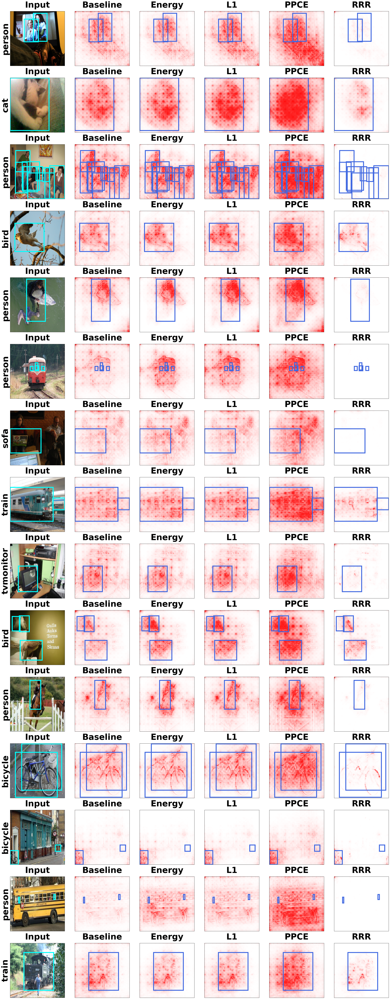

In [14]:
import torch
torch.cuda.empty_cache()

from visualize import visualize_fig9

visualize_fig9(
    [
        "BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.01_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossPPCE_origmodel_checkpoint_f1_best.pt_resnet50_lr0.001_sll0.001_layerInput/model_checkpoint_f1_best.pt",
        "FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossRRR_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll5e-05_layerInput/model_checkpoint_f1_best.pt",
    ],
    last=False
)

### 6. Visualize the model with dilated bounding boxes

To demonstrate the effect of dilated bounding boxes, we visualize the model with dilated bounding boxes. Due to computational resource limitation, we load in the pre-trained model and visualize the model with dilated bounding boxes.

BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_FT_dilated_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt
FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt
FT/DIL/bcos_FT_dilated_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

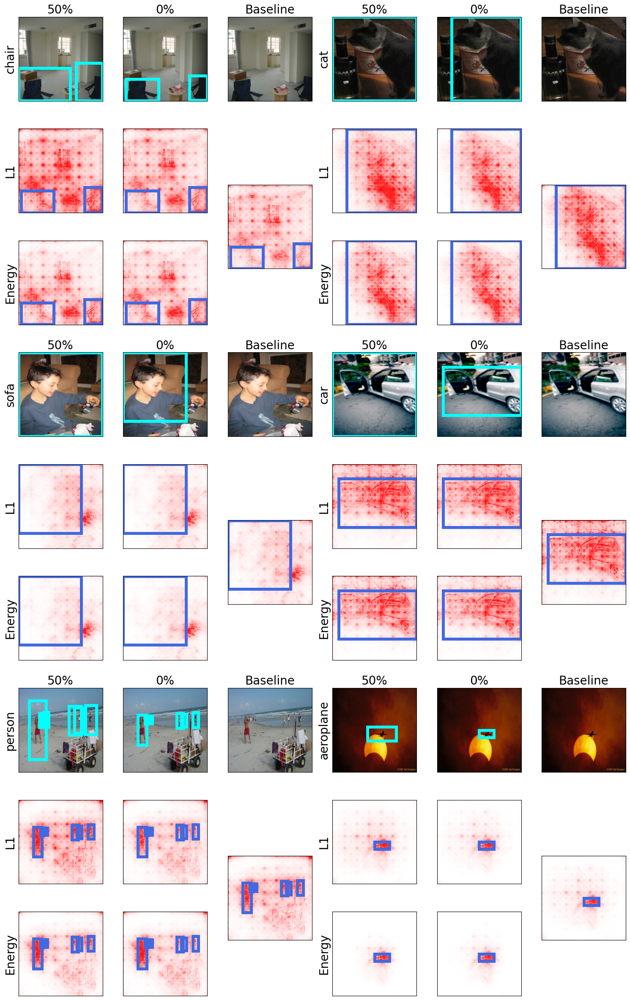

In [15]:
import torch
torch.cuda.empty_cache()

from visualize import visualize_fig11

visualize_fig11(
    base_path="BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt",
    energy_paths=[
        "FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/DIL/bcos_FT_dilated_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt",
    ],
    L1_paths=[
        "FT/DIL/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt",
        "FT/DIL/bcos_FT_dilated_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput_dil0.5/model_checkpoint_f1_best.pt",
    ],
    last=False
    )

### 7. Show that the Pareto Front works

To show that the Pareto Front works, we need to evaluate the model on the test set and calculate the Pareto Front. But due to computational resource limitation, we selected 6 model checkpoints from the fine-tuned model (see the given path) and evaluate them on the test set.

In [16]:
from pareto_FT import pareto_demo

bin_width=0.005,
layer="Final"
data_split="test"
attribution_method="BCos"
eval_batch_size=4
model_dir="./FT/VOC2007/bcos/fin/l1/bcos_finetunedobjlocpareto_attrBCos_loclossL1_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerFinal/pareto_front"
output_dir="./p_curves_demo/VOC2007/bcos/Final/L1"

pareto_demo(
    bin_width=bin_width,
    layer=layer,
    data_split=data_split,
    attribution_method=attribution_method,
    eval_batch_size=eval_batch_size,
    model_dir=model_dir,
    output_dir=output_dir
)

100%|██████████| 1238/1238 [00:48<00:00, 25.31it/s]


Validation Metrics: {'Accuracy': 0.9715165495872498, 'Precision': 0.8774517774581909, 'Recall': 0.7327044010162354, 'F-Score': 0.7985719442367554, 'True Positives': 5592.0, 'True Negatives': 90627.0, 'False Positives': 781.0, 'False Negatives': 2040.0, 'BB-Loc': 0.6188596601731691, 'BB-IoU': 0.262054114084956, 'BB-IoU-Adapt': 0.18594447452860208, 'Average-Loss': 0.10765420793524082}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)


100%|██████████| 1238/1238 [00:49<00:00, 25.11it/s]


Validation Metrics: {'Accuracy': 0.9715367555618286, 'Precision': 0.880474328994751, 'Recall': 0.7296907901763916, 'F-Score': 0.7980225086212158, 'True Positives': 5569.0, 'True Negatives': 90652.0, 'False Positives': 756.0, 'False Negatives': 2063.0, 'BB-Loc': 0.5783531045843895, 'BB-IoU': 0.2896006418738362, 'BB-IoU-Adapt': 0.1934903742917194, 'Average-Loss': 0.09790644853681278}
Current Pareto Front Size: 1
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)


100%|██████████| 1238/1238 [00:50<00:00, 24.74it/s]


Validation Metrics: {'Accuracy': 0.9707087874412537, 'Precision': 0.8621956706047058, 'Recall': 0.7378144860267639, 'F-Score': 0.7951704859733582, 'True Positives': 5631.0, 'True Negatives': 90508.0, 'False Positives': 900.0, 'False Negatives': 2001.0, 'BB-Loc': 0.674812879768999, 'BB-IoU': 0.2097804279722185, 'BB-IoU-Adapt': 0.1620789793126028, 'Average-Loss': 0.13163783207463525}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


100%|██████████| 1238/1238 [00:50<00:00, 24.54it/s]


Validation Metrics: {'Accuracy': 0.971031904220581, 'Precision': 0.8752166628837585, 'Recall': 0.7278563976287842, 'F-Score': 0.7947635650634766, 'True Positives': 5555.0, 'True Negatives': 90616.0, 'False Positives': 792.0, 'False Negatives': 2077.0, 'BB-Loc': 0.6457770038315369, 'BB-IoU': 0.23786510146682394, 'BB-IoU-Adapt': 0.1745602715453735, 'Average-Loss': 0.11449188331024712}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


 47%|████▋     | 582/1238 [00:24<00:27, 23.70it/s]

100%|██████████| 1238/1238 [00:52<00:00, 23.61it/s]


Validation Metrics: {'Accuracy': 0.9719507098197937, 'Precision': 0.8793373107910156, 'Recall': 0.7371593117713928, 'F-Score': 0.8019956946372986, 'True Positives': 5626.0, 'True Negatives': 90636.0, 'False Positives': 772.0, 'False Negatives': 2006.0, 'BB-Loc': 0.6109908760856303, 'BB-IoU': 0.4375153568764916, 'BB-IoU-Adapt': 0.19539064088592212, 'Average-Loss': 0.12509782633989425}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


100%|██████████| 1238/1238 [00:50<00:00, 24.36it/s]


Validation Metrics: {'Accuracy': 0.9713247418403625, 'Precision': 0.8705536723136902, 'Recall': 0.7375524044036865, 'F-Score': 0.7985529899597168, 'True Positives': 5629.0, 'True Negatives': 90571.0, 'False Positives': 837.0, 'False Negatives': 2003.0, 'BB-Loc': 0.5366813552549434, 'BB-IoU': 0.3190338866409736, 'BB-IoU-Adapt': 0.19464724043193327, 'Average-Loss': 0.09062178184989966}
Current Pareto Front Size: 2
Pareto Costs: (F1:0.7986, EPG:0.6189, MOD16)(F1:0.7952, EPG:0.6748, MOD43)


The results are shown in the following figure. We can see the distinction between the Pareto Front and the non-Pareto Front.

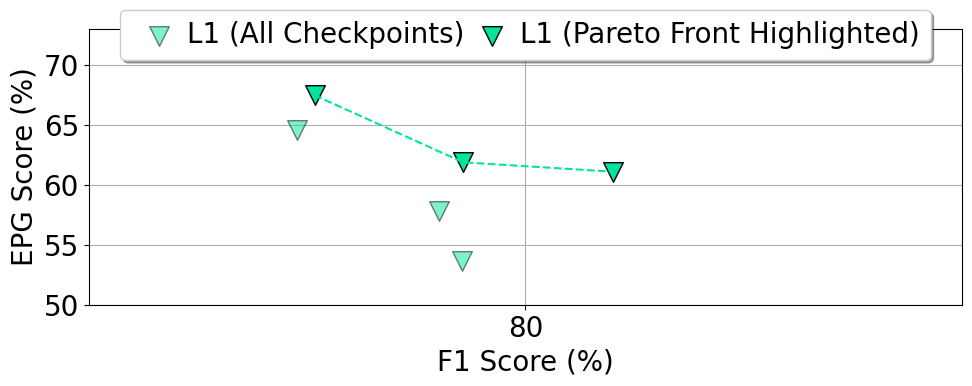

In [17]:
from utils import *
from visualize import *

root_folder = './p_curves_demo/VOC2007/bcos/Final/L1/pareto'
data_f1_epg_pareto = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

root_folder = './p_curves_demo/VOC2007/bcos/Final/L1/not_pareto'
data_f1_epg_not_pareto = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

plot_pareto_curve(
    baseline_data=data_f1_epg_pareto['vanilla']['input']['baseline'],
    l1_data=data_f1_epg_pareto['bcos']['final']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=(79, 81),
    set_ylim=(50, 73),
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG",
    plot_demo_data=True,
    demo_data=data_f1_epg_not_pareto['bcos']['final']['l1'])

### 8. Show the results from the additional experiment (fairness.py), which looks at each class individually and downloads a .csv file with the results.

In [18]:
import argparse

model_pathBase = "./BASE/VOC2007/bcos_standard_attrNone_loclossNone_origNone_resnet50_lr0.0001_sll1.0_layerInput/model_checkpoint_f1_best.pt"
model_pathFN50 = "./FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_final_50.pt"
model_pathFNbest = "./FT/VOC2007/bcos_finetunedobjlocpareto_attrBCos_loclossEnergy_origmodel_checkpoint_f1_best.pt_resnet50_lr0.0001_sll0.005_layerInput/model_checkpoint_f1_best.pt"
dataset = "VOC2007"
split = "test"
metric = "BB-Loc"

from fairness import main

args = {
    "model_pathBase": model_pathBase,
    "model_pathFN50": model_pathFN50,
    "model_pathFNbest": model_pathFNbest,
    "dataset": dataset,
    "split": split,
    "metric": metric
}

args = argparse.Namespace(**args)

main(args)

Found model with specs:  bcos Energy Final BCos VOC2007


100%|██████████| 1238/1238 [00:50<00:00, 24.71it/s]


Found model with specs:  bcos Energy Final BCos VOC2007


 54%|█████▍    | 672/1238 [00:26<00:22, 25.55it/s]

100%|██████████| 1238/1238 [00:49<00:00, 24.77it/s]


Found model with specs:  bcos Energy Final BCos VOC2007


100%|██████████| 1238/1238 [00:51<00:00, 24.17it/s]


Visualize the results from the additional experiment in a dataframe. Due to computational resource limitation, we load in the pre-trained model and show the results from the additional experiment.

In [19]:
import pandas as pd

pd.read_csv("VOC2007_BB-Loc_test.csv")

,class-name,num-samples,bl-means,ft50-means,percentage50_diff,ftbest-means,percentagebest_diff
0,aeroplane,tensor(205),57.7,66.3,14.9,61.3,6.2
1,bicycle,tensor(250),55.4,66.8,20.6,59.4,7.2
2,bird,tensor(289),42.8,63.4,48.2,50.5,18.0
3,boat,tensor(176),42.2,55.8,32.4,45.9,8.8
4,bottle,tensor(240),16.9,24.5,44.9,18.0,6.6
5,bus,tensor(183),59.9,73.9,23.4,63.8,6.7
6,car,tensor(775),48.8,62.3,27.6,53.7,9.9
7,cat,tensor(332),65.9,79.0,20.0,70.0,6.3
8,chair,tensor(545),25.6,41.8,63.1,28.9,12.6
9,cow,tensor(127),54.6,69.1,26.7,60.0,10.0


### 9. Show the evaluation results of the fine-tuned model (Pareto front)

In this section, we show the evaluation results of the fine-tuned model (Pareto front) on the test set. Because of computational resource limitation, we saved the evaluation results in .npz files. The evaluation results are loaded from the .npz files  with the ```load_data_from_folders_with_npz_files``` function in ```utils.py``` and visualized with the ```plot_pareto_curve``` function in ```visualize.py```.

*The plots for figure 1 from our reproducibility study are shown below.*

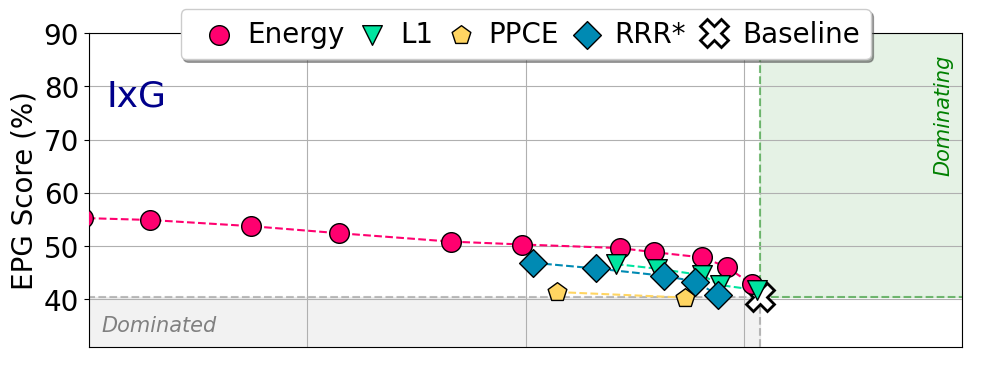

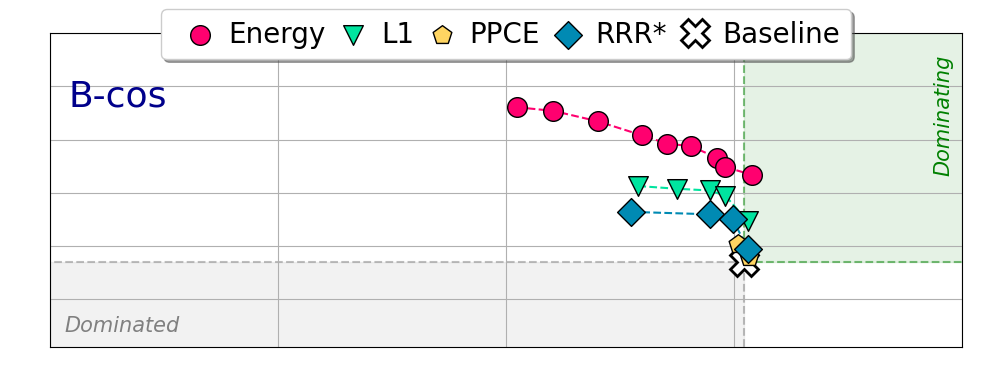

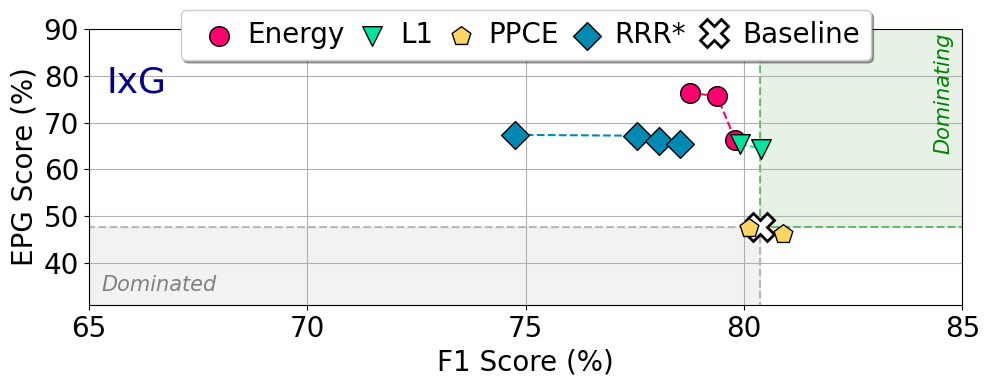

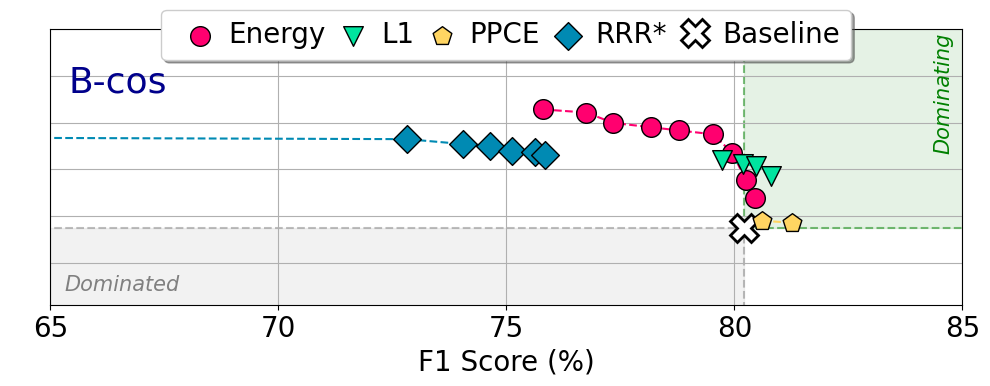

In [20]:
from utils import *
from visualize import *

root_folder = './p_curves/VOC2007'
data_f1_epg = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (65, 85)
y_lim_range = (31, 90)
step_size_xticks = 5
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_f1_epg['vanilla']['input']['baseline'],
    energy_data=data_f1_epg['vanilla']['input']['energy'],
    l1_data=data_f1_epg['vanilla']['input']['l1'],
    ppce_data=data_f1_epg['vanilla']['input']['ppce'],
    rrr_data=data_f1_epg['vanilla']['input']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_epg['bcos']['input']['baseline'],
    energy_data=data_f1_epg['bcos']['input']['energy'],
    l1_data=data_f1_epg['bcos']['input']['l1'],
    ppce_data=data_f1_epg['bcos']['input']['ppce'],
    rrr_data=data_f1_epg['bcos']['input']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

plot_pareto_curve(
    baseline_data=data_f1_epg['vanilla']['final']['baseline'],
    energy_data=data_f1_epg['vanilla']['final']['energy'],
    l1_data=data_f1_epg['vanilla']['final']['l1'],
    ppce_data=data_f1_epg['vanilla']['final']['ppce'],
    rrr_data=data_f1_epg['vanilla']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_epg['bcos']['final']['baseline'],
    energy_data=data_f1_epg['bcos']['final']['energy'],
    l1_data=data_f1_epg['bcos']['final']['l1'],
    ppce_data=data_f1_epg['bcos']['final']['ppce'],
    rrr_data=data_f1_epg['bcos']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=(step_size_yticks),
    hide_x_ticks=False,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

*The plots for figure 2 from our reproducibility study are shown below.*

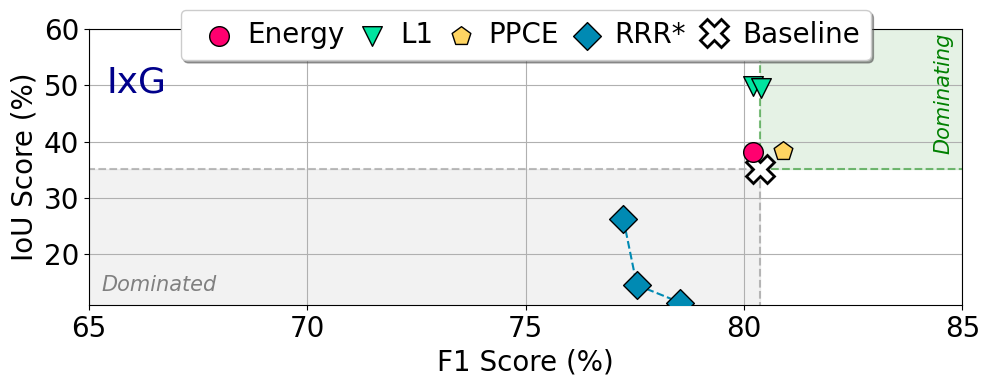

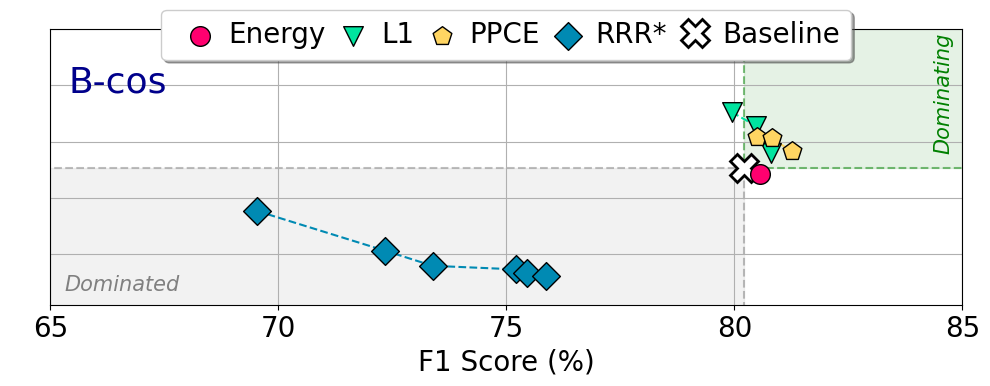

In [21]:
from utils import *
from visualize import *

root_folder = './p_curves/VOC2007'
data_f1_iou = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'iou_score'))

x_lim_range = (65, 85)
y_lim_range = (11, 60)
step_size_xticks = 5
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_f1_iou['vanilla']['final']['baseline'],
    energy_data=data_f1_iou['vanilla']['final']['energy'],
    l1_data=data_f1_iou['vanilla']['final']['l1'],
    ppce_data=data_f1_iou['vanilla']['final']['ppce'],
    rrr_data=data_f1_iou['vanilla']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='IoU Score (%)',
    title='',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="IxG")

plot_pareto_curve(
    baseline_data=data_f1_iou['bcos']['final']['baseline'],
    energy_data=data_f1_iou['bcos']['final']['energy'],
    l1_data=data_f1_iou['bcos']['final']['l1'],
    ppce_data=data_f1_iou['bcos']['final']['ppce'],
    rrr_data=data_f1_iou['bcos']['final']['rrr'],
    x_label='F1 Score (%)',
    y_label='IoU Score (%)',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="B-cos")

*The plots for figure 4 from our reproducibility study are shown below.*

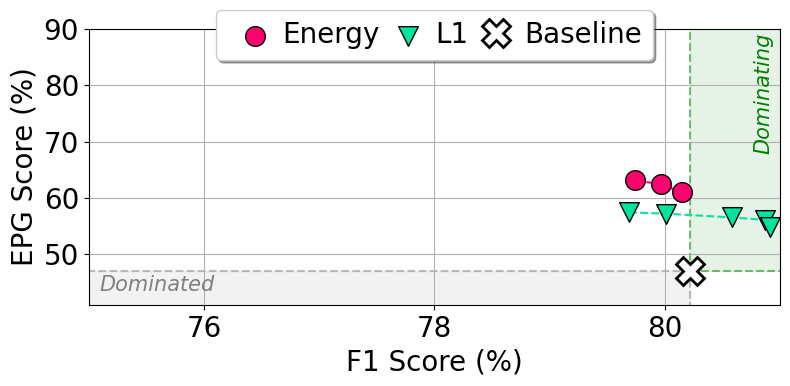

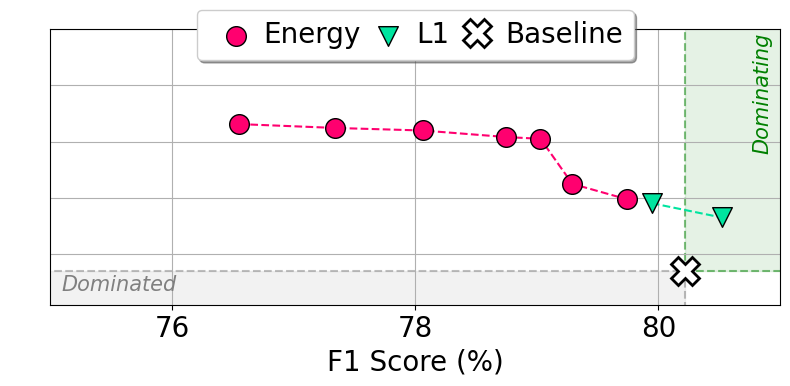

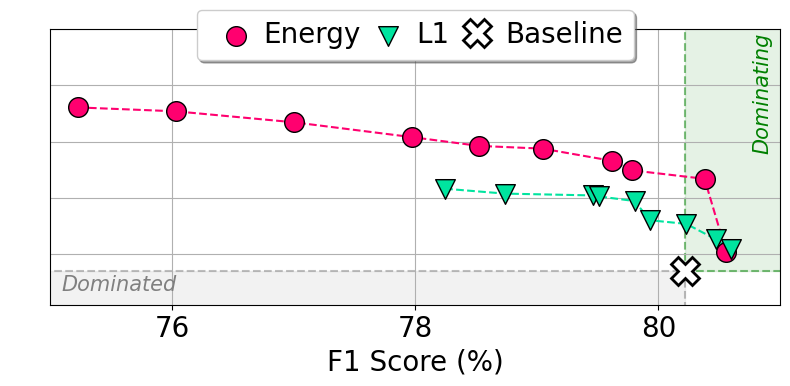

In [22]:
from utils import *
from visualize import *

root_folder = './p_c_ann'
data_limited_ann_f1_epg = utils.load_data_from_folders_with_npz_files_with_limited_ann(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (75, 81)
y_lim_range = (41, 90)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim0.01']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim0.01']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim0.01']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20,
    attribution_method="")

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim0.1']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim0.1']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim0.1']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="")

plot_pareto_curve(
    baseline_data=data_limited_ann_f1_epg['bcos']['lim1.0']['baseline'],
    energy_data=data_limited_ann_f1_epg['bcos']['lim1.0']['energy'],
    l1_data=data_limited_ann_f1_epg['bcos']['lim1.0']['l1'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    figsize=(8, 4),
    set_xlim=x_lim_range,
    set_ylim=y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20,
    attribution_method="")

*The plots for figure 5 from our reproducibility study are shown below.*

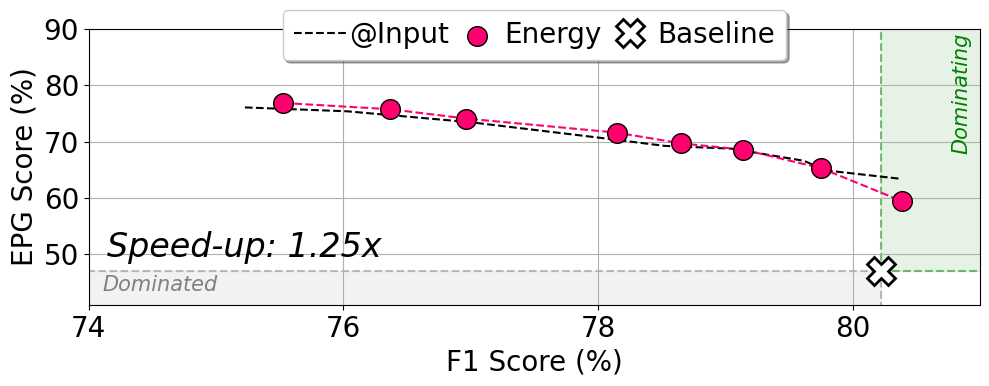

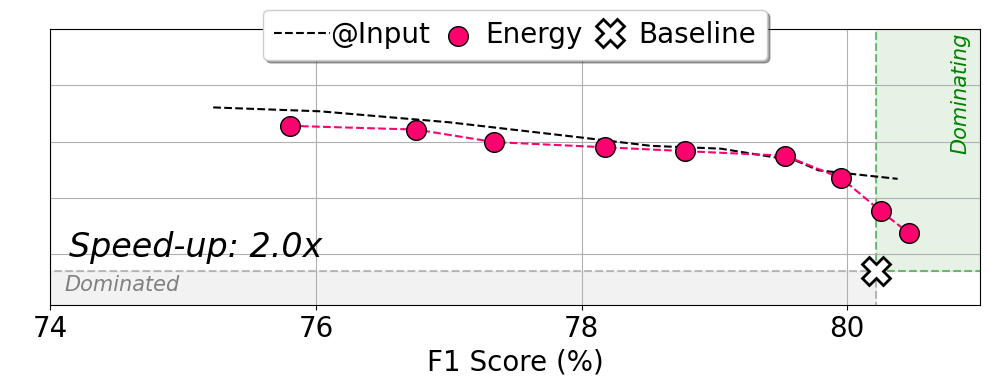

In [23]:
from utils import *
from visualize import *    

root_folder = './p_curves/VOC2007'
data_speed_up_f1_epg = utils.load_data_from_folders_with_npz_files(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (74, 81)
y_lim_range = (41, 90)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_speed_up(
    baseline_data=data_speed_up_f1_epg['bcos']['input']['baseline'],
    energy_data_input_layer=data_speed_up_f1_epg['bcos']['input']['energy'],
    energy_data=data_speed_up_f1_epg['bcos']['mid2']['energy'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    speed_up_text='Speed-up: 1.25x',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_speed_up(
    baseline_data=data_speed_up_f1_epg['bcos']['input']['baseline'],
    energy_data_input_layer=data_speed_up_f1_epg['bcos']['input']['energy'],
    energy_data=data_speed_up_f1_epg['bcos']['final']['energy'],
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    speed_up_text='Speed-up: 2.0x',
    figsize=(10, 4),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_y_ticks=True,
    fontsize=20)

*The plots for figure 6 from our reproducibility study are shown below.*

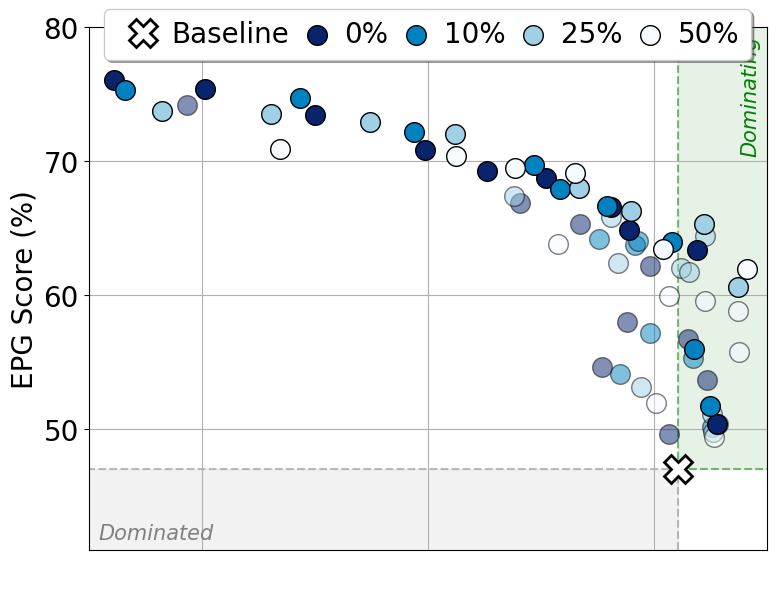

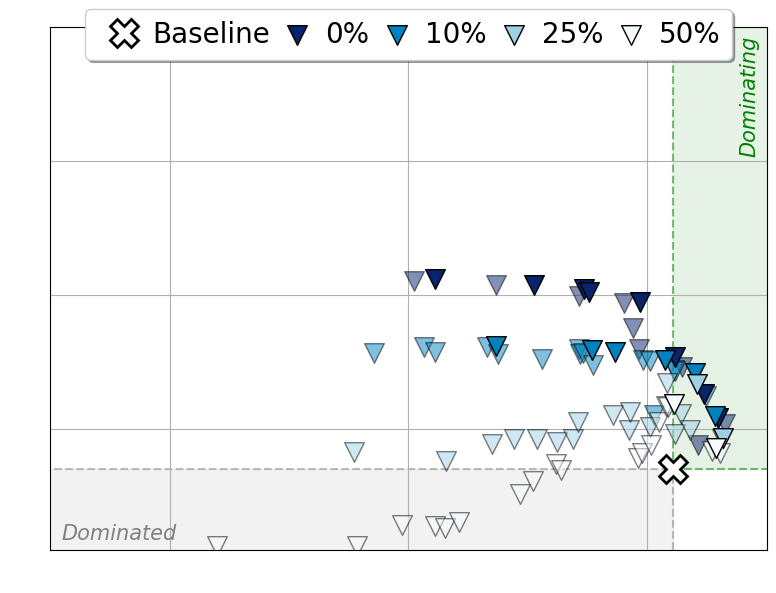

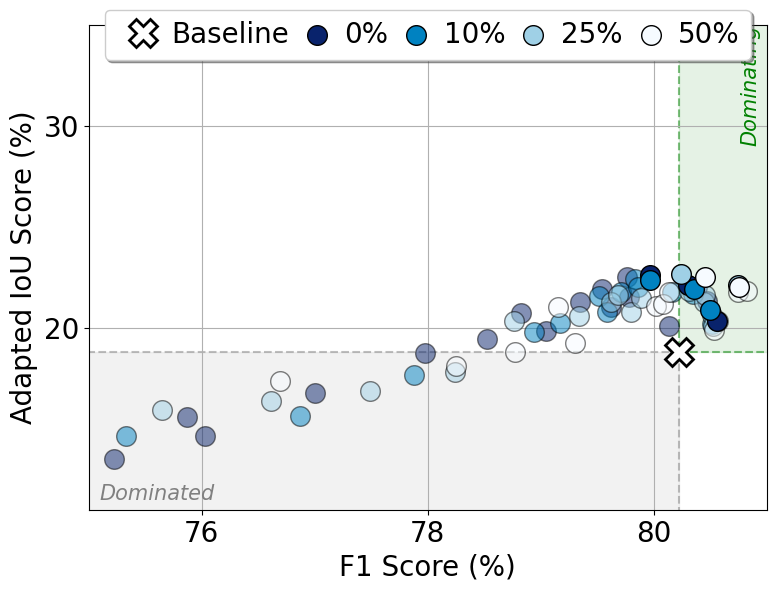

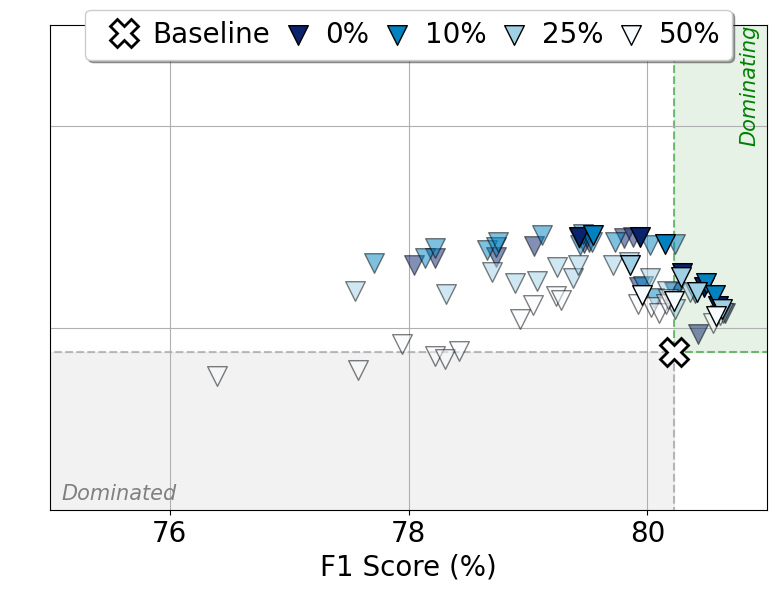

In [24]:
from utils import *
from visualize import *    

root_folder = './p_c_dil'
data_dilation_f1_epg = utils.load_data_from_folders_with_npz_files_with_dilation(root_folder, metrics=('f_score', 'bb_score'))

x_lim_range = (75, 81)
y_lim_range = (41, 80)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['energy'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['energy'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['energy'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['energy'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['energy'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['energy'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['energy'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['energy'],
    loss='Energy',
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_energy_f1_epg_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['l1'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['l1'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['l1'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['l1'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['l1'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['l1'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['l1'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['l1'],
    loss='L1',
    x_label='F1 Score (%)',
    y_label='EPG Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_l1_f1_epg_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=True,
    hide_y_ticks=True,
    fontsize=20)

root_folder = './p_c_dil'
data_dilation_f1_epg = utils.load_data_from_folders_with_npz_files_with_dilation(root_folder, metrics=('f_score', 'adapt_iou_score'))

x_lim_range = (75, 81)
y_lim_range = (11, 35)
step_size_xticks = 2
step_size_yticks = 10

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['energy'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['energy'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['energy'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['energy'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['energy'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['energy'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['energy'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['energy'],
    loss='Energy',
    x_label='F1 Score (%)',
    y_label='Adapted IoU Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_energy_f1_adapt_iou_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=False,
    fontsize=20)

plot_pareto_curve_dilation(
    baseline_data=data_dilation_f1_epg['bcos']['dil0']['baseline'],
    data_0=data_dilation_f1_epg['bcos']['dil0']['l1'],
    data_01=data_dilation_f1_epg['bcos']['dil0.1']['l1'],
    data_025=data_dilation_f1_epg['bcos']['dil0.25']['l1'],
    data_05=data_dilation_f1_epg['bcos']['dil0.5']['l1'],
    data_0_not_pareto=data_dilation_f1_epg['bcos']['dil0_not_pareto']['l1'],
    data_01_not_pareto=data_dilation_f1_epg['bcos']['dil0.1_not_pareto']['l1'],
    data_025_not_pareto=data_dilation_f1_epg['bcos']['dil0.25_not_pareto']['l1'],
    data_05_not_pareto=data_dilation_f1_epg['bcos']['dil0.5_not_pareto']['l1'],
    loss='L1',
    x_label='F1 Score (%)',
    y_label='Adapted IoU Score (%)',
    save_path='./images/fig_10_voc2007_bcos_resnet50_dilation_loss_l1_f1_adapt_iou_pareto_curve.png',
    figsize=(8, 6),
    set_xlim = x_lim_range,
    set_ylim = y_lim_range,
    step_size_xticks=step_size_xticks,
    step_size_yticks=step_size_yticks,
    hide_x_ticks=False,
    hide_y_ticks=True,
    fontsize=20)